In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [ ]:
import os
for dirname, _, filenames in os.walk('/content/drive/MyDrive/Images/Agriculture crop images'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        break

/content/drive/MyDrive/Images/Agriculture crop images/Crop_detect.ipynb
/content/drive/MyDrive/Images/Agriculture crop images/some_more_images/some_more_images/jute/jute043a.jpg
/content/drive/MyDrive/Images/Agriculture crop images/some_more_images/some_more_images/maize/maize046a.jpg
/content/drive/MyDrive/Images/Agriculture crop images/some_more_images/some_more_images/rice/rice045a.jpg
/content/drive/MyDrive/Images/Agriculture crop images/some_more_images/some_more_images/sugarcane/sugarcane042a.jpg
/content/drive/MyDrive/Images/Agriculture crop images/some_more_images/some_more_images/Wheat/wheat043a.jpg
/content/drive/MyDrive/Images/Agriculture crop images/crop_images/rice/rice017a.jpeg
/content/drive/MyDrive/Images/Agriculture crop images/crop_images/jute/jute018a.jpeg
/content/drive/MyDrive/Images/Agriculture crop images/crop_images/sugarcane/sugarcane0003a.jpeg
/content/drive/MyDrive/Images/Agriculture crop images/crop_images/maize/maize011a.jpeg
/content/drive/MyDrive/Images/A

Loading modules

In [ ]:
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf 
import keras 
from keras.layers import Conv2D
from keras.models import Sequential
from keras.layers import MaxPool2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.models import Model
from keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import cv2
import re
import random
random.seed(0)
np.random.seed(0)

Plotting some images

Text(0.5, 1.0, 'wheat')

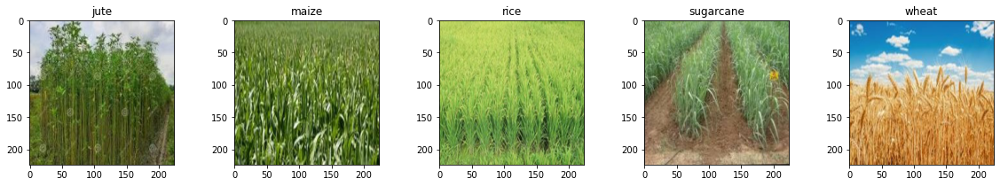

In [ ]:
wheat = plt.imread("/content/drive/MyDrive/Images/Agriculture crop images/kag2/wheat/wheat0004a.jpeg")
jute = plt.imread("/content/drive/MyDrive/Images/Agriculture crop images/kag2/jute/jute005a.jpeg")
cane = plt.imread("/content/drive/MyDrive/Images/Agriculture crop images/kag2/sugarcane/sugarcane0010arot.jpeg")
rice = plt.imread("/content/drive/MyDrive/Images/Agriculture crop images/kag2/rice/rice032ahs.jpeg")
maize = plt.imread("/content/drive/MyDrive/Images/Agriculture crop images/kag2/maize/maize003a.jpeg")
plt.figure(figsize=(20,3))
plt.subplot(1,5,1)
plt.imshow(jute)
plt.title("jute")
plt.subplot(1,5,2)
plt.imshow(maize)
plt.title("maize")
plt.subplot(1,5,3)
plt.imshow(rice)
plt.title("rice")
plt.subplot(1,5,4)
plt.imshow(cane)
plt.title("sugarcane")
plt.subplot(1,5,5)
plt.imshow(wheat)
plt.title("wheat")

Converting to training and testing data

In [ ]:
jutepath = "/content/drive/MyDrive/Images/Agriculture crop images/kag2/jute"
maizepath = "/content/drive/MyDrive/Images/Agriculture crop images/kag2/maize"
ricepath = "/content/drive/MyDrive/Images/Agriculture crop images/kag2/rice"
sugarcanepath = "/content/drive/MyDrive/Images/Agriculture crop images/kag2/sugarcane"
wheatpath = "/content/drive/MyDrive/Images/Agriculture crop images/kag2/wheat"

jutefilename = os.listdir(jutepath)
maizefilename = os.listdir(maizepath)
ricefilename = os.listdir(ricepath)
sugarcanefilename = os.listdir(sugarcanepath)
wheatfilename = os.listdir(wheatpath)

X= []

In [ ]:
for fname in jutefilename:
    X.append([os.path.join(jutepath,fname),0])
for fname in maizefilename:
    X.append([os.path.join(maizepath,fname),1])
for fname in ricefilename:
    X.append([os.path.join(ricepath,fname),2])
for fname in sugarcanefilename:
    X.append([os.path.join(sugarcanepath,fname),3]) 
for fname in wheatfilename:
    X.append([os.path.join(wheatpath,fname),4])  
X = pd.DataFrame(X,columns = ['path','labels'])    

In [ ]:
X.head()

,path,labels
0,/content/drive/MyDrive/Images/Agriculture crop...,0
1,/content/drive/MyDrive/Images/Agriculture crop...,0
2,/content/drive/MyDrive/Images/Agriculture crop...,0
3,/content/drive/MyDrive/Images/Agriculture crop...,0
4,/content/drive/MyDrive/Images/Agriculture crop...,0


In [ ]:
ohencoder = OneHotEncoder(handle_unknown='ignore',sparse=False)
ohlabel = pd.DataFrame(ohencoder.fit_transform(X[['labels']]),dtype = 'float64',columns = ['label0','label1','label2','label3','label4'])
label_X = X.copy()
X = pd.concat([X,ohlabel],axis = 1)
new_X = X.drop(['labels'],axis = 1)

In [ ]:
train,test = train_test_split(new_X,test_size=0.2,random_state=32,shuffle = True)

In [ ]:
X_train = train['path'].values
y_train = train.drop(['path'],axis=1).values
X_test = test['path'].values
y_test = test.drop(['path'],axis=1).values

In [ ]:
def deep_pipeline(data):
    flat = []
    for i in data:
        img = plt.imread(i)
        img = img/255.
        flat.append(img)
    flat =  np.array(flat)    
    flat = flat.reshape(-1,224,224,3)       
    return flat

In [ ]:
dx_train = deep_pipeline(X_train)
dx_test = deep_pipeline(X_test)

Model training

In [ ]:
keras.backend.clear_session()
vgg = keras.applications.VGG19(input_shape=(224,224,3),include_top=False,weights = 'imagenet',pooling='avg')
vgg.trainable = False
vggmodel = keras.Sequential([vgg
                         ,Dense(1000,activation='tanh'),Dense(1000,activation='tanh'),Dense(1000,activation='tanh'),Dense(5,activation='softmax')])

vggmodel.compile(optimizer = 'adam',loss = 'categorical_crossentropy',metrics=['accuracy'])
vggmodel.summary()

80134624/80134624 [==============================] - 2s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 512)               20024384  
                                                                 
 dense (Dense)               (None, 1000)              513000    
                                                                 
 dense_1 (Dense)             (None, 1000)              1001000   
                                                                 
 dense_2 (Dense)             (None, 1000)              1001000   
                                                                 
 dense_3 (Dense)             (None, 5)                 5005      
                                                                 
Total params: 22,544,389
Trainable params: 2,520,005
Non-trainable params: 20,024,384
_____________________________________

In [ ]:
hist = vggmodel.fit(dx_train,y_train,epochs=50,validation_split=0.3,batch_size=16)

Epoch 1/50
29/29 [==============================] - 15s 187ms/step - loss: 3.4979 - accuracy: 0.2533 - val_loss: 1.6639 - val_accuracy: 0.4197
Epoch 2/50
29/29 [==============================] - 4s 128ms/step - loss: 1.4584 - accuracy: 0.4511 - val_loss: 1.3983 - val_accuracy: 0.4767
Epoch 3/50
29/29 [==============================] - 4s 128ms/step - loss: 1.1086 - accuracy: 0.5400 - val_loss: 1.2140 - val_accuracy: 0.5440
Epoch 4/50
29/29 [==============================] - 4s 128ms/step - loss: 1.0831 - accuracy: 0.5911 - val_loss: 1.0017 - val_accuracy: 0.6425
Epoch 5/50
29/29 [==============================] - 4s 129ms/step - loss: 0.6812 - accuracy: 0.7133 - val_loss: 1.8804 - val_accuracy: 0.4611
Epoch 6/50
29/29 [==============================] - 4s 129ms/step - loss: 0.9363 - accuracy: 0.6644 - val_loss: 0.9509 - val_accuracy: 0.5855
Epoch 7/50
29/29 [==============================] - 4s 130ms/step - loss: 0.6077 - accuracy: 0.7644 - val_loss: 0.9374 - val_accuracy: 0.6943
Epoch

(0.0, 4.0)

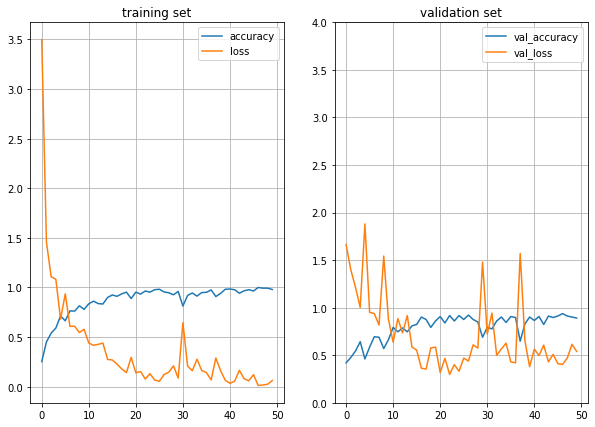

In [ ]:
plt.figure(figsize=(10,7))
plt.subplot(1,2,1)
plt.plot(hist.history['accuracy'],label='accuracy')
plt.plot(hist.history['loss'],label='loss')
plt.legend()
plt.title("training set")
plt.grid()
plt.subplot(1,2,2)
plt.plot(hist.history['val_accuracy'],label='val_accuracy')
plt.plot(hist.history['val_loss'],label='val_loss')
plt.legend()
plt.title("validation set")
plt.grid()
plt.ylim((0,4))

Test set accuracy

In [ ]:
score = vggmodel.evaluate(dx_test,y_test)
print("accuracy: ", score[1])

6/6 [==============================] - 4s 165ms/step - loss: 0.5348 - accuracy: 0.8820
accuracy:  0.8819875717163086


In [ ]:
pred = vggmodel.predict(dx_test)
prediction = np.argmax(pred,axis=1)
true = np.argmax(y_test,axis=1)
best_prob = [pred[num,:][i] for num,i in enumerate(prediction)]

6/6 [==============================] - 1s 194ms/step


Confusion matrix

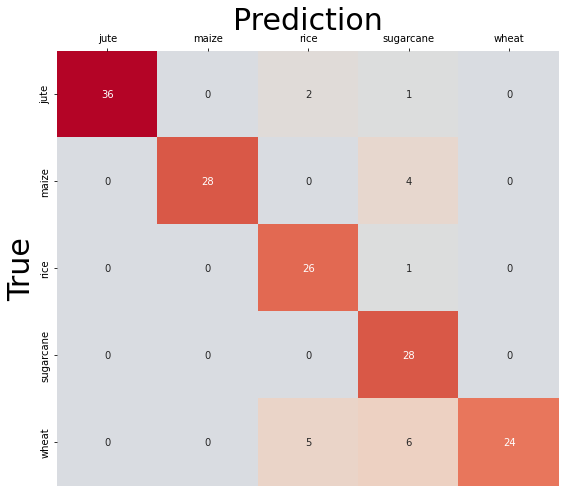

In [ ]:
plt.figure(figsize = (9,8))
class_label = ['jute','maize','rice','sugarcane','wheat']
fig = sns.heatmap(confusion_matrix(true,prediction),cmap= "coolwarm",annot=True,vmin=0,cbar = False,
            center = True,xticklabels=class_label,yticklabels=class_label)
fig.set_xlabel("Prediction",fontsize=30)
fig.xaxis.set_label_position('top')
fig.set_ylabel("True",fontsize=30)
fig.xaxis.tick_top()

Pipelining

In [ ]:
def deepmodelpipeline(imagepath,model = vggmodel,label=[-1]):
    pdict = {0:"jute",1:"maize",2:"rice",3:"sugarcane",4:"wheat"}
    pred_x = deep_pipeline([imagepath])
    prediction = model.predict(pred_x)
    pred = np.argmax(prediction[0])
    plt.imshow(plt.imread(imagepath))
    if (label[0]!=-1):
        plt.title("prediction : {0} % {1:.2f} \ntrue        : {2}".format(pdict[pred],prediction[0,pred]*100,pdict[np.argmax(label)]))
    else:
        plt.title("prediction : {0}, % {1:.2f}".format(pdict[pred],prediction[0,pred]*100))

Prediction on sample images

1/1 [==============================] - 0s 17ms/step


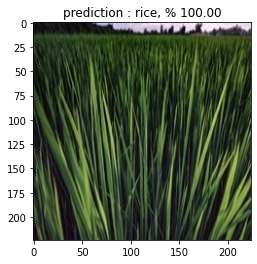

In [ ]:
deepmodelpipeline('/content/drive/MyDrive/Images/Agriculture crop images/kag2/rice/rice024ahs.jpeg')

1/1 [==============================] - 0s 16ms/step


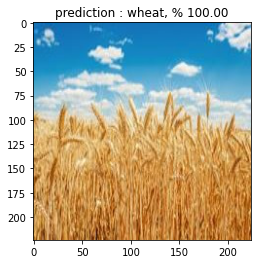

In [ ]:
deepmodelpipeline('/content/drive/MyDrive/Images/Agriculture crop images/kag2/wheat/wheat0004a.jpeg')

1/1 [==============================] - 0s 17ms/step


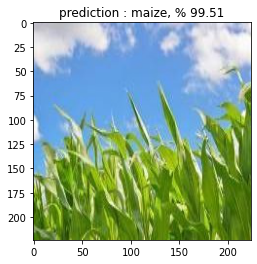

In [ ]:
deepmodelpipeline("/content/drive/MyDrive/Images/Agriculture crop images/kag2/maize/maize008ahf.jpeg")

1/1 [==============================] - 0s 17ms/step


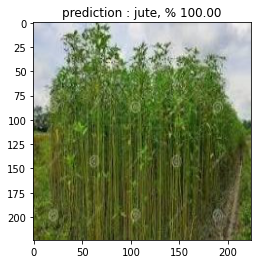

In [ ]:
deepmodelpipeline("/content/drive/MyDrive/Images/Agriculture crop images/kag2/jute/jute005a.jpeg")

Prediction on test images

1/1 [==============================] - 0s 17ms/step


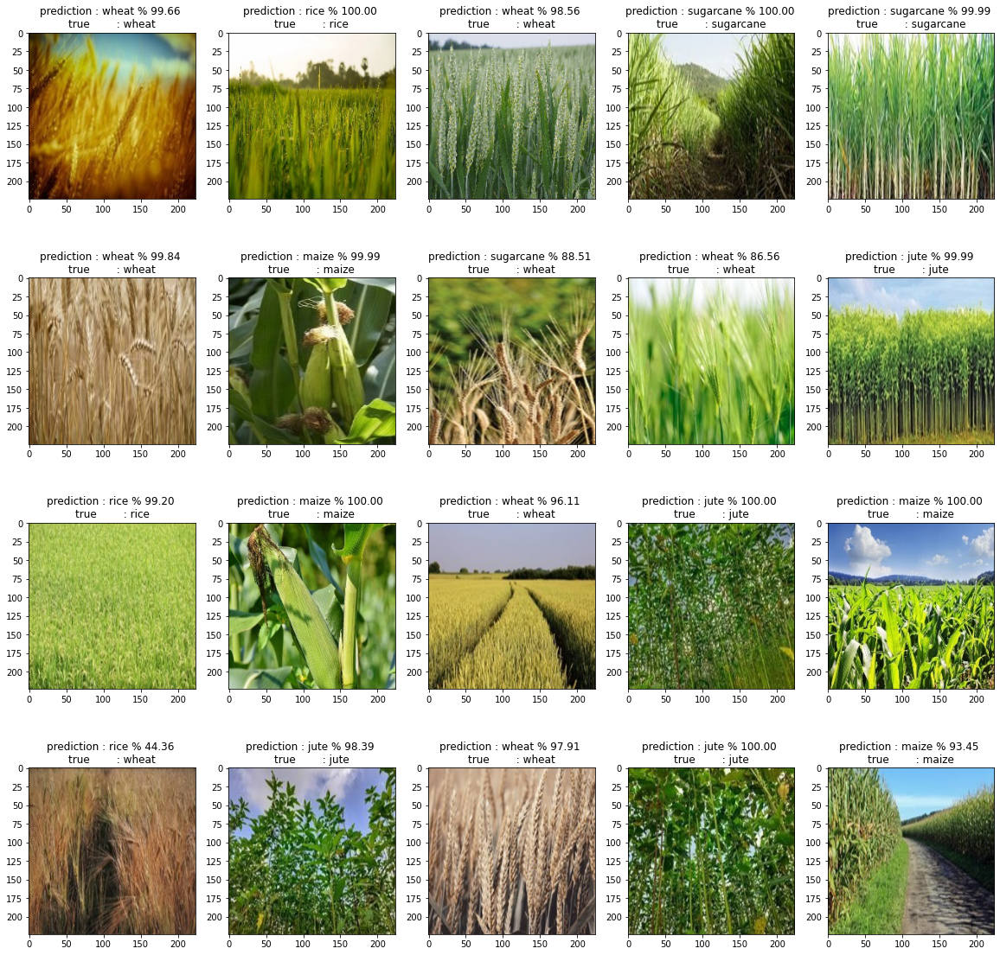

In [ ]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[0:20]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num])

1/1 [==============================] - 0s 16ms/step


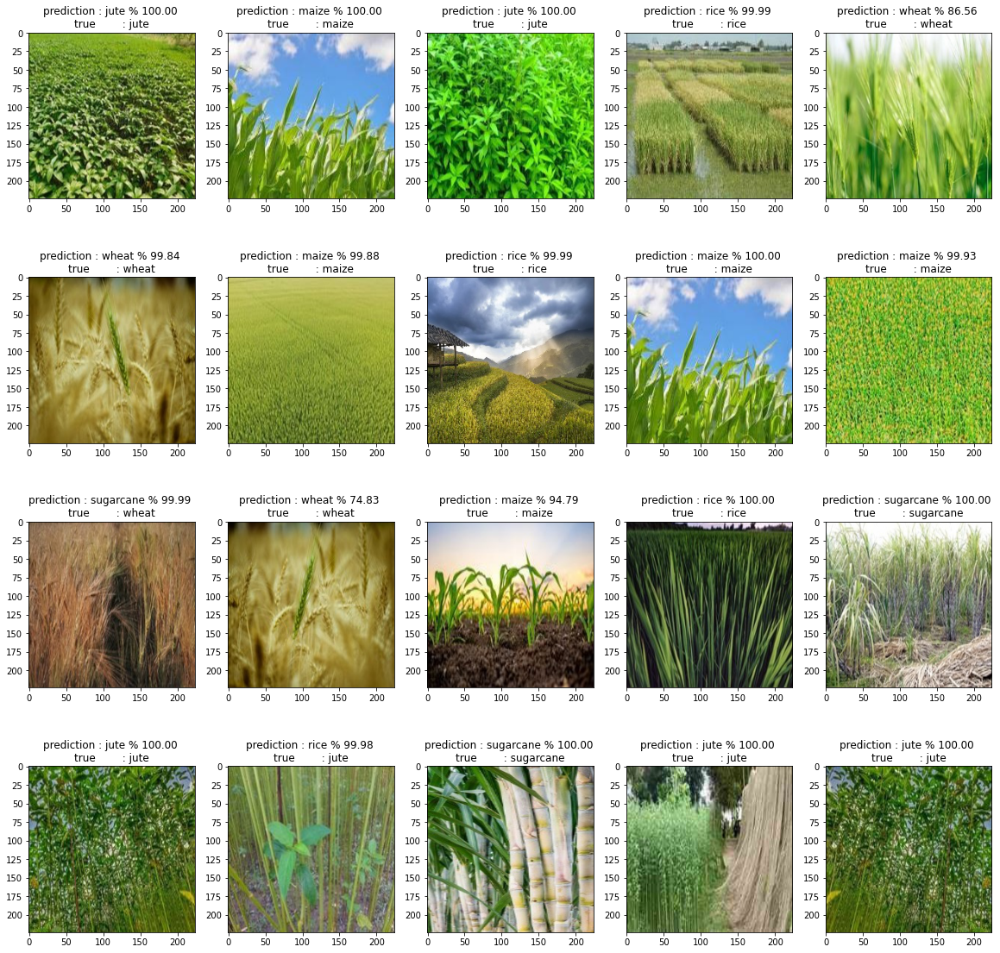

In [ ]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[20:40]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num+20])

1/1 [==============================] - 0s 16ms/step


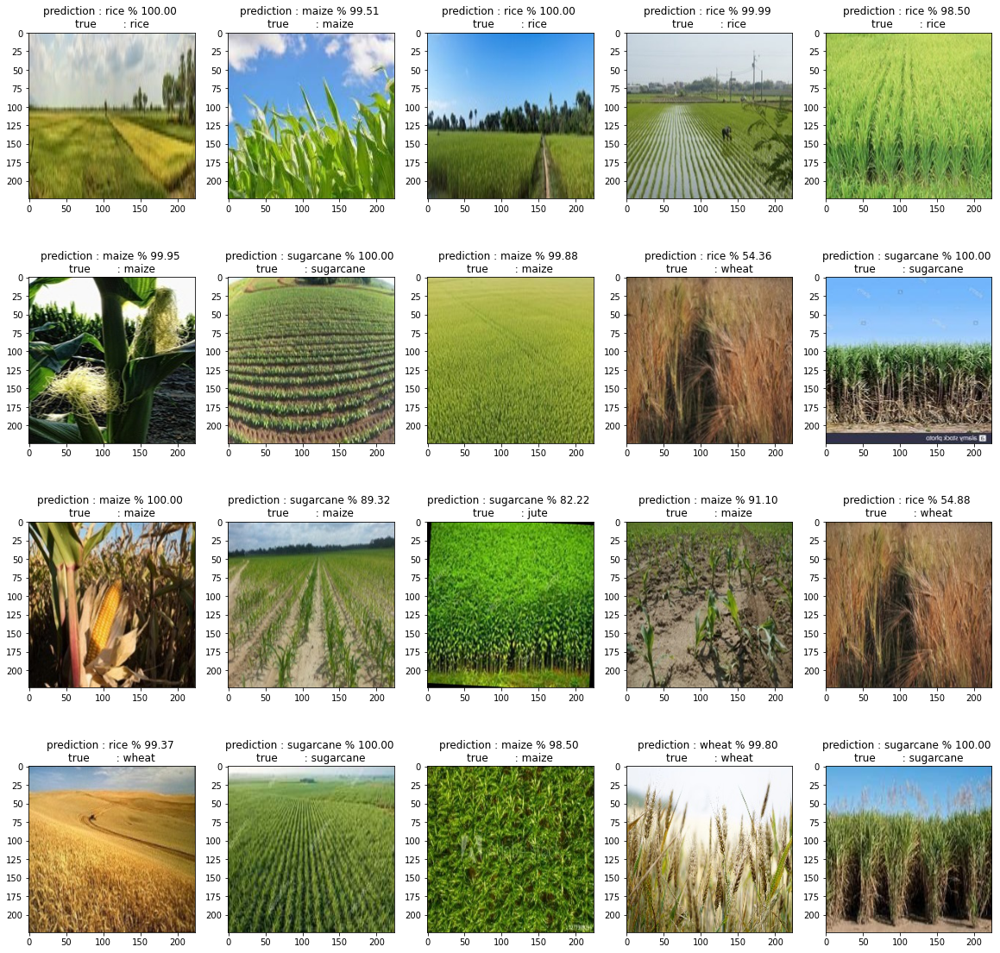

In [ ]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[40:60]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num+40])

In [ ]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[100:120]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num+100])

1/1 [==============================] - 0s 17ms/step


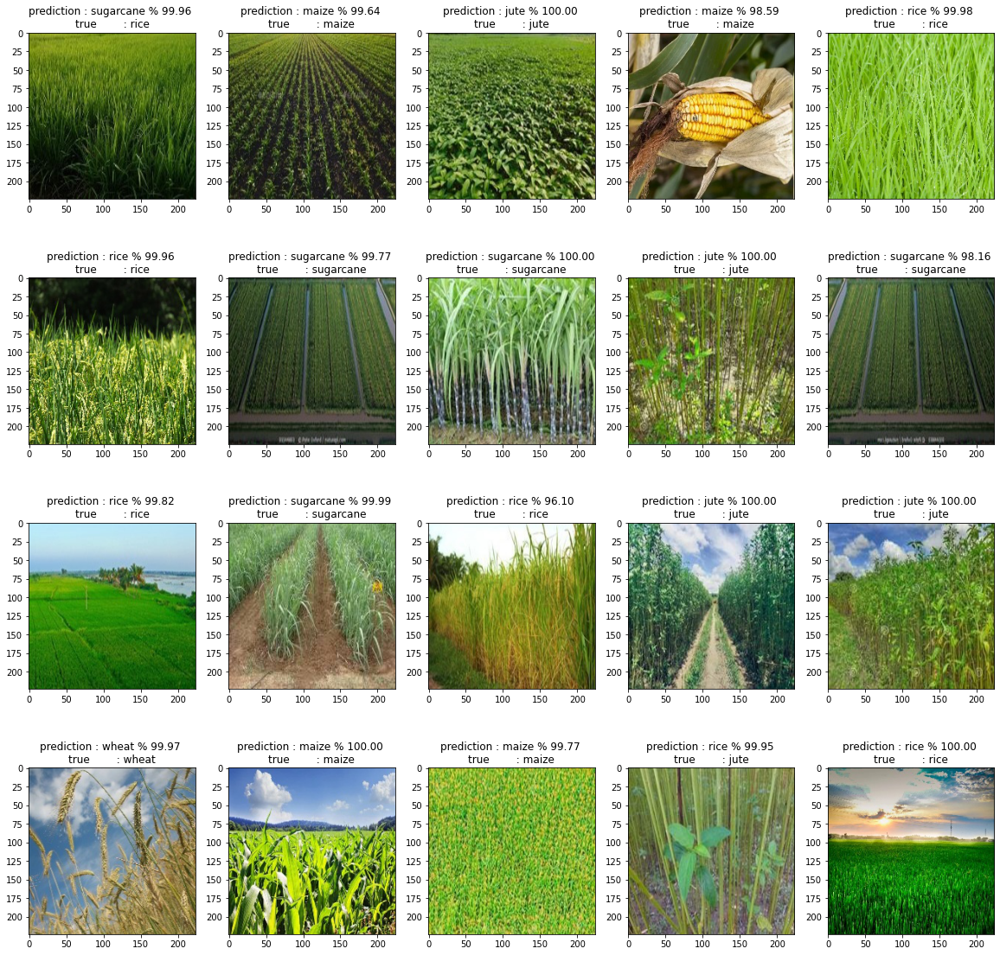

In [ ]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[140:160]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num+140])

Saving Model

In [ ]:
vggmodel.save_weights("/content/drive/MyDrive/Images/Agriculture crop images/vggmodelweight.h5")

Loading necessary preprocessing functions

In [ ]:
def resize_image(image_array):
    return cv2.resize(image_array,(224,224))
def rescale_image(image_array):
    return image_array*1./255
def read_image(image_path):
    return plt.imread(image_path)
def plot_image(image_array):
    try:
        plt.imshow(image_array)
    except:
        plt.imshow(image_array[0])
def preprocess_image(image_path,reshape = True):
    image = read_image(image_path)
    image = resize_image(image)
    image = rescale_image(image)
    if(reshape ==  True):
        image = image.reshape(-1,image.shape[0],image.shape[1],image.shape[2])    
    return image
def preprocess_imageslist(image_list):
    imagelist = np.array([preprocess_image(img,reshape=False) for img in image_list])
    return imagelist
def predict_and_plot(image,model):
    pred_dict = {0:"jute",1:"maize",2:"rice",3:"sugarcane",4:"wheat"}
    plt.imshow(image[0])
    prediction = model.predict(image) 
    pred = pred_dict[np.argmax(prediction)]
    plt.title(pred)
%matplotlib inline
def predict_and_plot5(imagelist,model):
    pred_dict = {0:"jute",1:"maize",2:"rice",3:"sugarcane",4:"wheat"}
    plt.figure(figsize=(20,10))
    for num,image in enumerate(imagelist):
        plt.subplot(1,5,num+1)
        plt.imshow(image)
        prediction = model.predict(image.reshape(-1,224,224,3)) 
        pred = pred_dict[np.argmax(prediction)]
        plt.title(pred)
def predict_and_plot51(imagelist,model):
    pred_dict = {0:"jute",1:"maize",2:"rice",3:"sugarcane",4:"wheat"}
    plt.figure(figsize=(100,10))
    for i in range(0,55,5):
        predict_and_plot5(imagelist[i:i+5],vggmodel)
def predict_and_plot30(imagelist,model):
    plt.figure(figsize=(40,10))
    for i in range(0,len(imagelist),5):
        predict_and_plot5(imagelist[i:i+5],vggmodel)

In [ ]:
testdata = pd.read_csv('/content/drive/MyDrive/Images/Agriculture crop images/test_data/testdata.csv')

In [ ]:
imagepath = testdata['testpath'].values
true_label = testdata['croplabel'].values
testdata.head()

In [ ]:
process_image = preprocess_imageslist(imagepath)

1/1 [==============================] - 0s 16ms/step


<Figure size 7200x720 with 0 Axes>

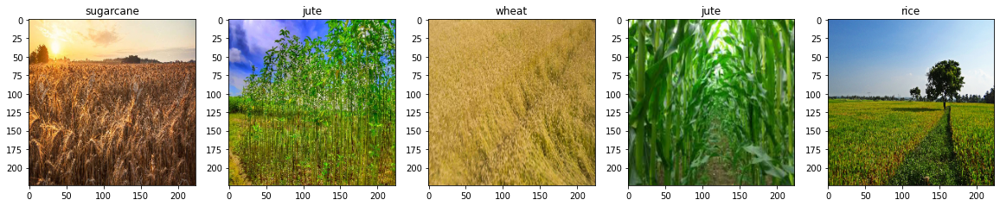

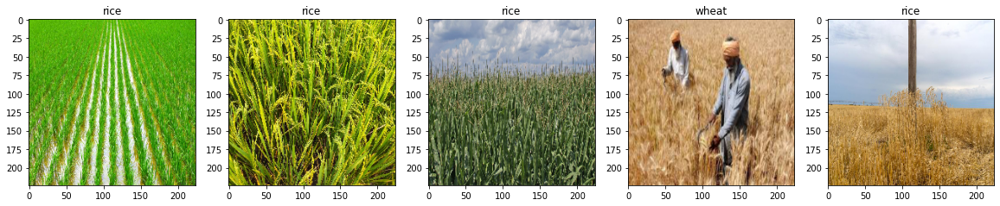

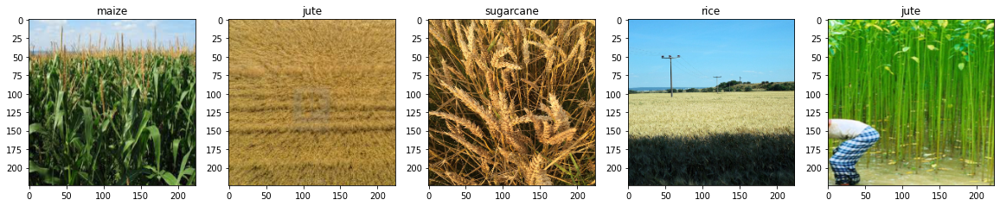

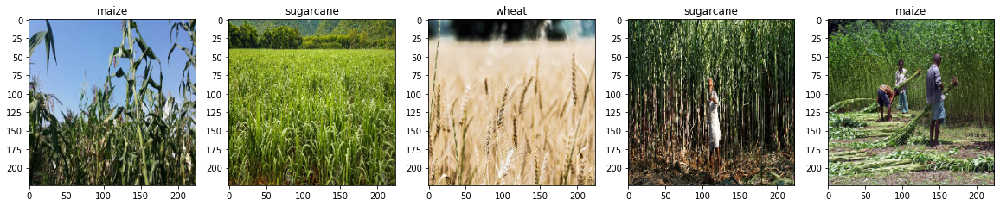

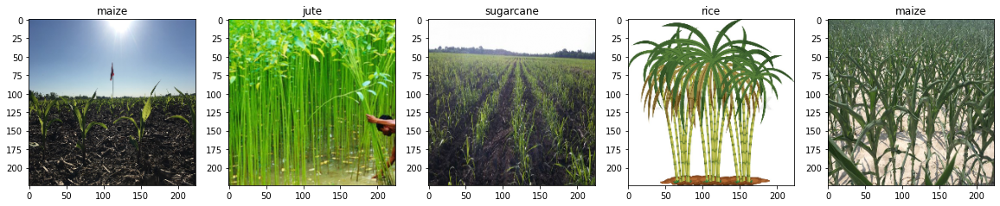

...

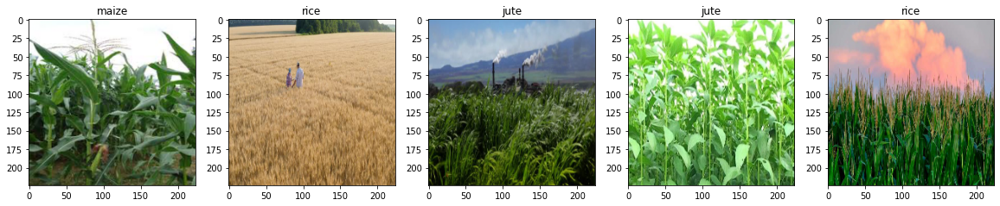

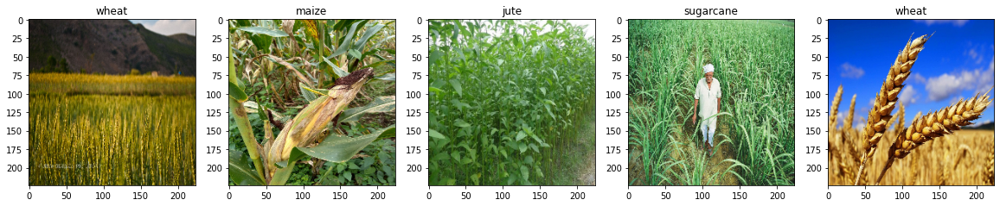

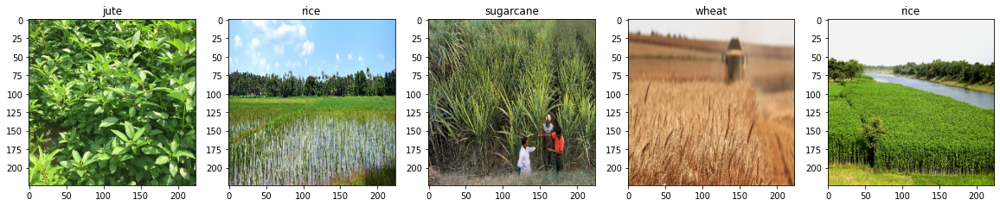

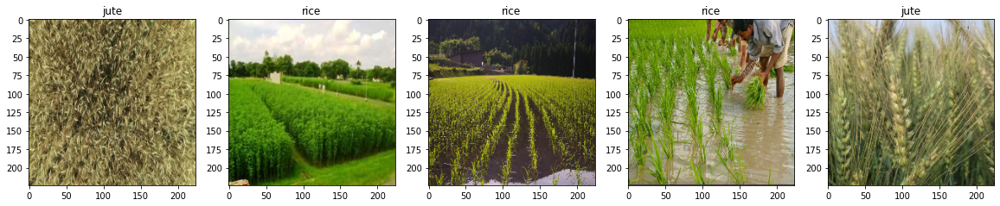

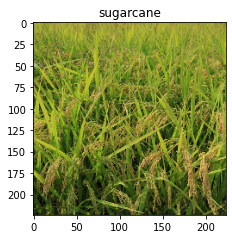

In [ ]:
predict_and_plot51(process_image,model=vggmodel)

In [ ]:
test_prediction = np.argmax(vggmodel.predict(process_image),axis=1)

In [ ]:
accuracy_score(true_label,test_prediction)

In [ ]:
plt.figure(figsize = (9,8))
class_label = ['jute','maize','rice','sugarcane','wheat']
fig = sns.heatmap(confusion_matrix(true_label,test_prediction),cmap= "coolwarm",annot=True,vmin=0,cbar = False,
            center = True,xticklabels=class_label,yticklabels=class_label)
fig.set_xlabel("Prediction",fontsize=30)
fig.xaxis.set_label_position('top')
fig.set_ylabel("True",fontsize=30)
fig.xaxis.tick_top()

In [ ]:
classify = true_label==test_prediction
wrong_classify = [num for num,p in enumerate(classify) if p==False]
correct_classify = [num for num,p in enumerate(classify) if p==True]

In [ ]:
correct_class_image = process_image[correct_classify]
wrong_class_image = process_image[wrong_classify]

Wrong classified Images

In [ ]:
predict_and_plot30(wrong_class_image,vggmodel)

Correct Classified Images

1/1 [==============================] - 0s 16ms/step


<Figure size 2880x720 with 0 Axes>

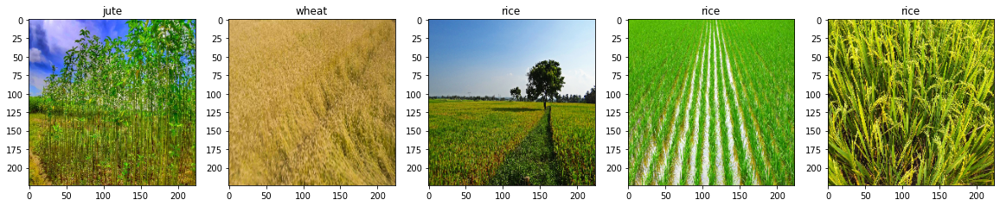

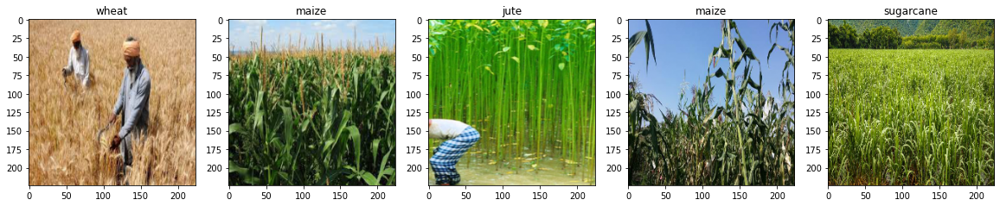

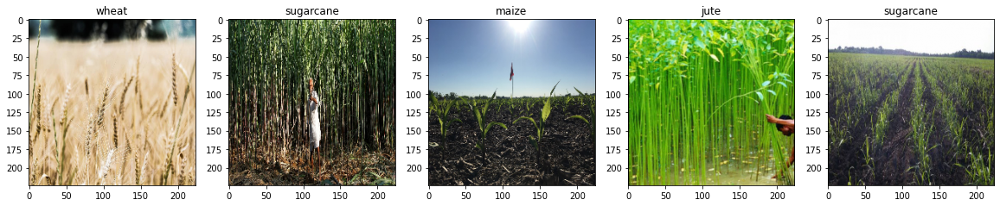

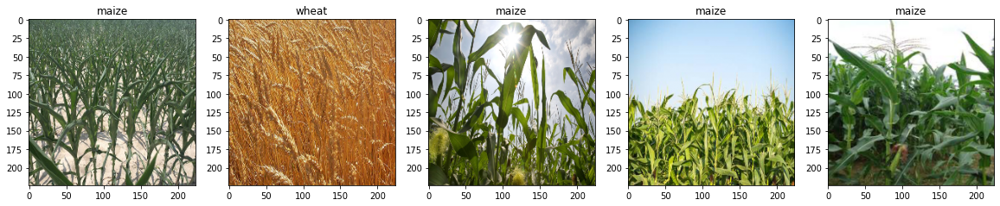

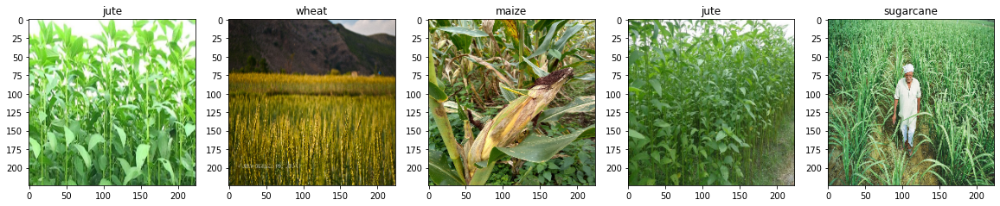

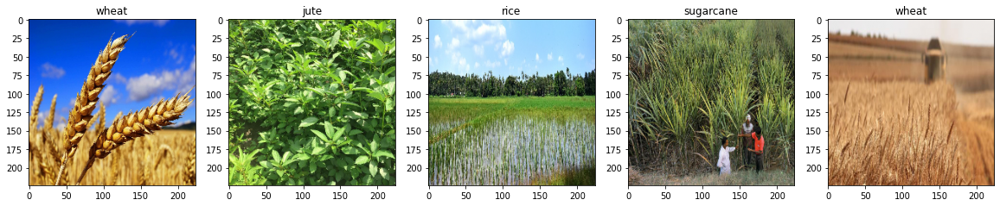

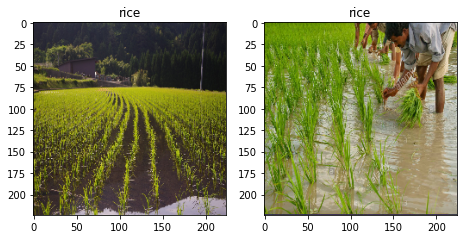

In [ ]:
predict_and_plot30(correct_class_image,vggmodel)

Creating dataframe to submit testssss data prediction

In [ ]:
labels = test_prediction.reshape(-1,1)
imagepath = imagepath.reshape(-1,1)
df = pd.DataFrame(np.append(imagepath,labels,axis=1),columns=['pathname','label'])
df.head()

In [ ]:
df.to_csv('/content/drive/MyDrive/Images/Agriculture crop images/test_data/submission.csv')

Enter your path of your image You want to predict

In [ ]:
get_image_path = "/content/drive/MyDrive/Images/Agriculture crop images/test_data/test_crop_image/jute-field.jpg"

In [ ]:
image1 = preprocess_image(get_image_path)
predict_and_plot(image1,model = vggmodel)